# Validation: Heldout Data Example

This notebook:

* loads a library defined model. 
* loads the data according to the data preprocessor class.
* holds-out the final few days of the data, and see's if they can be predicted. 

The way I propose doing this is holding out the confirmed observations for the final three days of the day for every country, and then plotting it for validation. This effectively changes the output model. 

Compared to the above changes, lets make the following changes:

* Switch the prior to the ICL prior used. 
* Refine the country list
* switch to binary interventions
* use active rather than confirmed cases
* transform into log space

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
### Initial imports
import logging
import numpy as np
import pandas as pd
import pymc3 as pm
import theano.tensor as T
import matplotlib.pyplot as plt

logging.basicConfig(level=logging.INFO)
log = logging.getLogger(__name__)

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from epimodel.pymc3_models.utils import geom_convolution
from epimodel.pymc3_models import cm_effect
from epimodel.pymc3_models.cm_effect.datapreprocessor import DataPreprocessor
from epimodel.pymc3_models.cm_effect.models import produce_CIs


%matplotlib inline

INFO:epimodel.regions:Name index has 7 potential conflicts: ['american samoa', 'georgia', 'guam', 'northern mariana islands', 'puerto rico', 'united states minor outlying islands', 'virgin islands (u.s.)']
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:
Countermeasures                               min   ... mean  ... max   ... unique
 1 Healthcare specialisation                  0.000 ... 0.053 ... 1.000 ... [0. 1.]
 2 Mask wearing over 70%                      0.000 ... 0.070 ... 1.000 ... [0. 1.]
 3 Gatherings limited to 1000                 0.000 ... 0.264 ... 1.000 ... [0. 1.]
 4 Gatherings limited to 100                  0.000 ... 0.234 ... 1.000 ... [0. 1.]
 5 Gatherings limited to 10                   0.000 ... 0.137 ... 1.000 ... [0. 1.]
 6 Business suspended - some                  0.000 ... 0.266 ... 1.000 ... [0. 1.]
 7 Business suspended - many                  0.000 ... 0.195 ... 1.000 ... [0. 1.]
 8 Schools and universities closed            0.000 ... 0.330 ... 1.

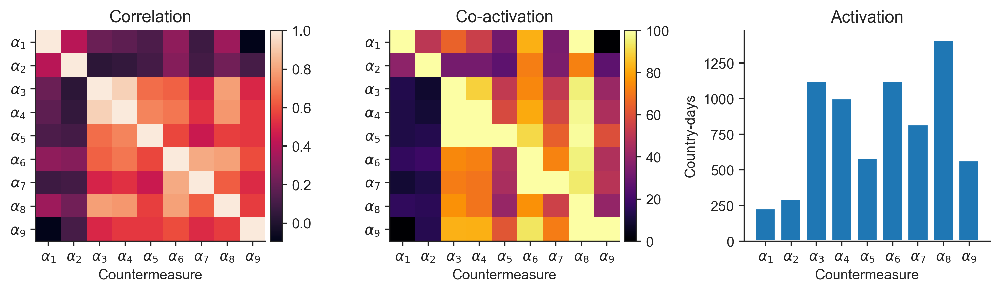

In [3]:
regions = ['AT', 'BA', 'BE', 'BG', 'CH', 'CZ', 'DE', 'DK', 'EE', 'ES', 'FI', 'FR', 'GB', 'GR', 'HR', 'HU', 'IE', 'IS', 'IT', 'LT', 'NL', 'PL', 'RO', 'RS', 'RU', 'SE', 'SI', 'SK']
# Same, outside Europe
regions += ['AD', 'CN-HK', 'EG', 'IL', 'JP', 'KR', 'MX', 'SG']

regions = regions
features = ['Healthcare specialisation', 
             'Mask wearing over 70%',
 'Gatherings limited to 1000',    
 'Gatherings limited to 100',
 'Gatherings limited to 10',
 'Business suspended - some',
 'Business suspended - many',
 'Schools and universities closed',
 'General curfew'
 ]

dp = DataPreprocessor(end_date="2020-04-21")
data = dp.preprocess_data("../../data", regions, features, selected_cm_set="countermeasures-model-boolean_Gat3Bus2SchCurHespMa.csv")
def mask_region(d, region, start):
    heldout = d.Rs.index(region)
    d.Active.mask[heldout,start:] = True
    d.Confirmed.mask[heldout,start:] = True
    d.Deaths.mask[heldout,start:] = True
    d.NewDeaths.mask[heldout,start:] = True

    
mask_region(data, 'DE', 32)
mask_region(data, 'ES', 30)
mask_region(data, 'GB', 32)
mask_region(data, 'GR', 30)





In [4]:
with cm_effect.models.CMConfirmedAndDeaths(data) as model:
    model.build()

/Users/jsalvatier/Library/Caches/pypoetry/virtualenvs/epimodel-Y5DpXmSQ-py3.8/lib/python3.8/site-packages/pymc3/model.py:1430: ImputationWarning: Data in ObservedConfirmed contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)
/Users/jsalvatier/Library/Caches/pypoetry/virtualenvs/epimodel-Y5DpXmSQ-py3.8/lib/python3.8/site-packages/pymc3/model.py:1430: ImputationWarning: Data in ObservedDeaths contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)


In [6]:
import pickle 
with open("combined_model_start.pickle", "rb") as file:
    start = pickle.load(file)

In [8]:
with model:
    model.trace = pm.sample(1000, chains=2, cores=2, init='adapt_diag', start=start)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
INFO:pymc3:Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 2 jobs)
NUTS: [ObservedDeaths_missing, ObservedConfirmed_missing, InitialSize, Growth, DelayCAlpha, DelayCMean, ReportRateLog, ReportRateStd, ReportRateMean, CM_Alpha, RegionGrowthRate, HyperGrowthRateVar, HyperGrowthRateMean, DeathsNoise]
INFO:pymc3:NUTS: [ObservedDeaths_missing, ObservedConfirmed_missing, InitialSize, Growth, DelayCAlpha, DelayCMean, ReportRateLog, ReportRateStd, ReportRateMean, CM_Alpha, RegionGrowthRate, HyperGrowthRateVar, HyperGrowthRateMean, DeathsNoise]
Sampling 2 chains, 0 divergences: 100%|██████████| 3000/3000 [32:41<00:00,  1.53draws/s]    
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
INFO:pymc3:The rhat statistic is larger than 1.05 for some paramete

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/jsalvatier/workspace/cov19/epimodel/notebooks/heldout_validation/out


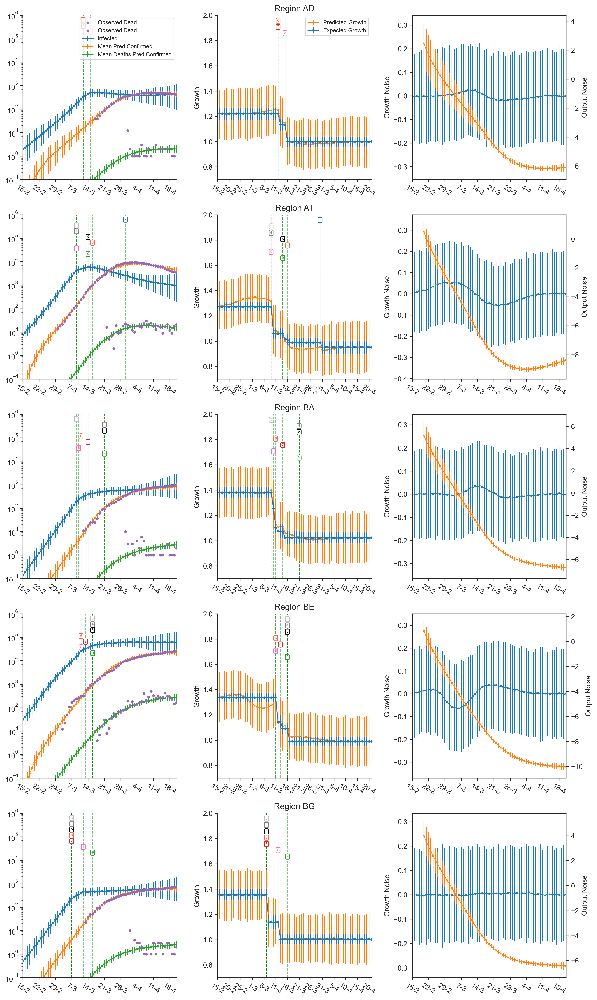

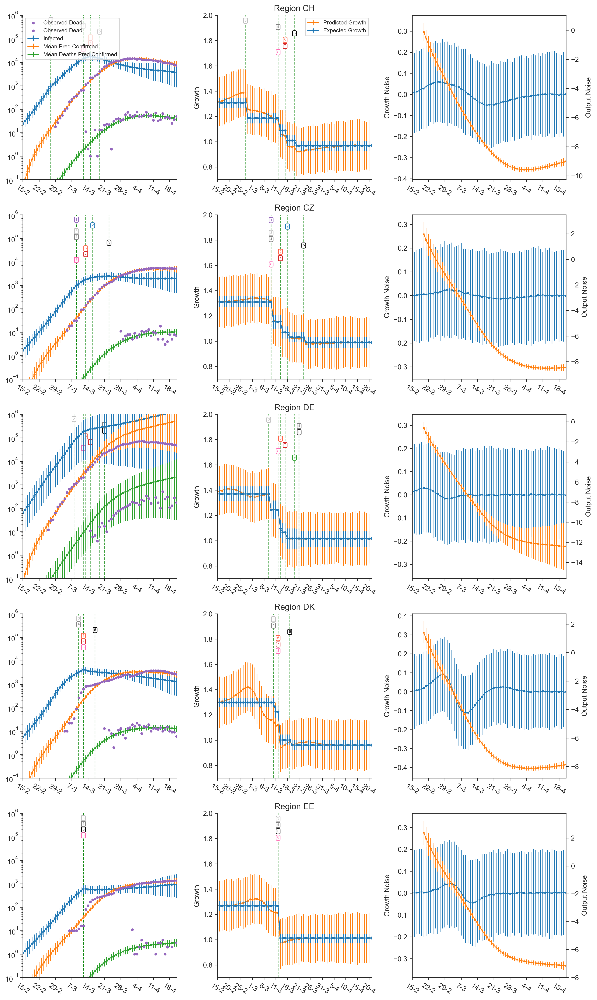

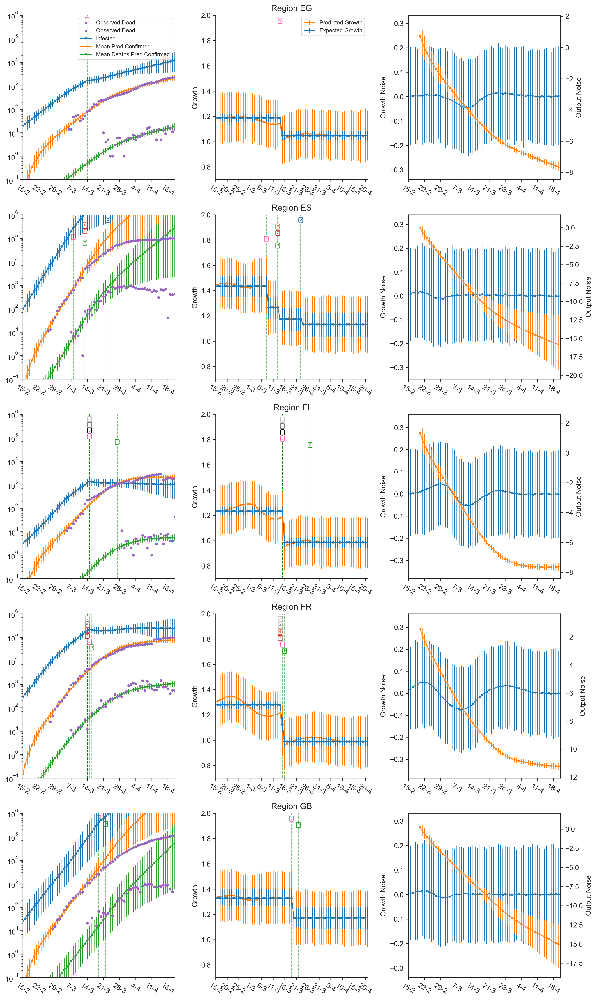

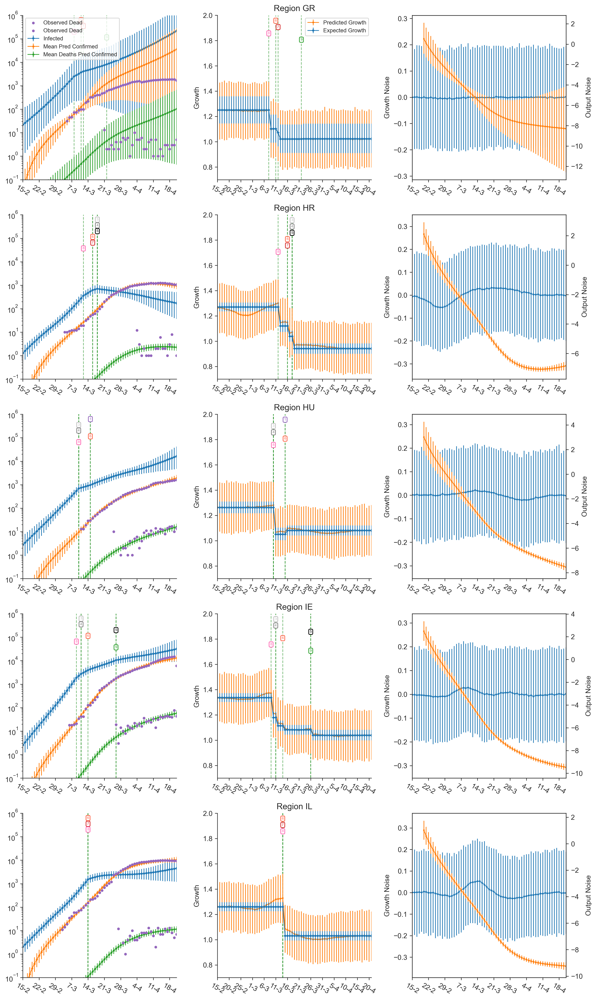

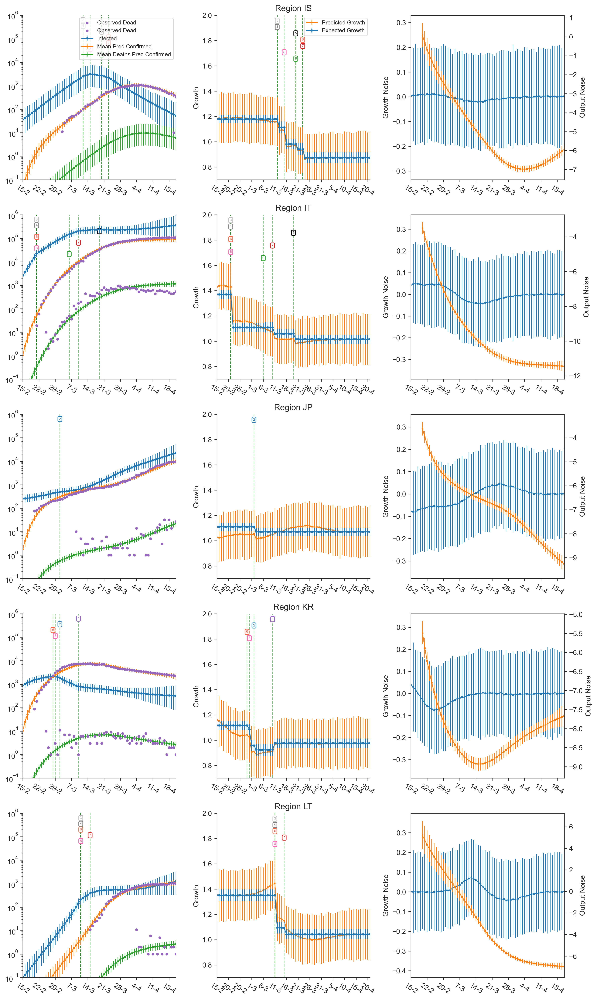

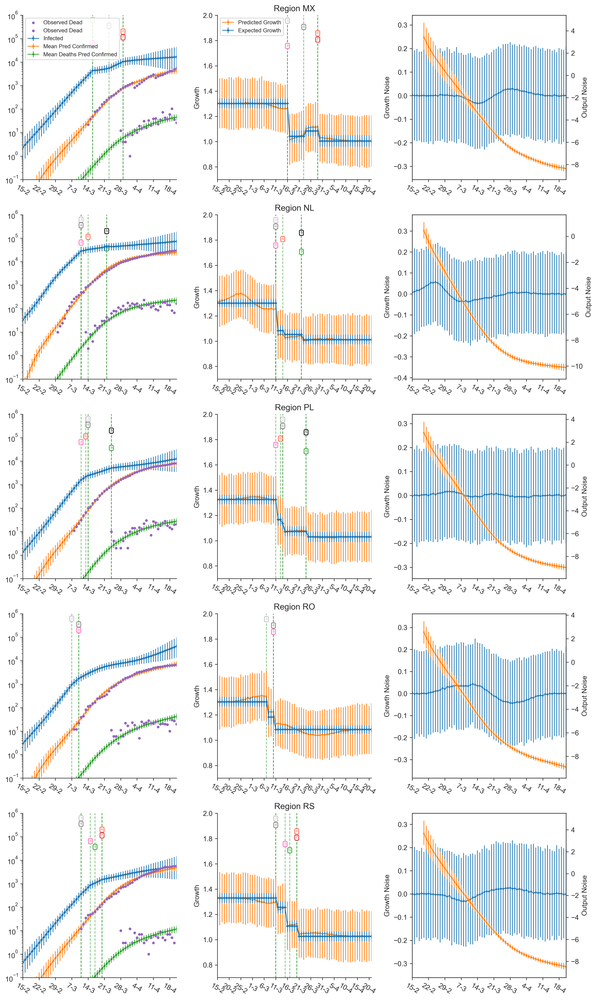

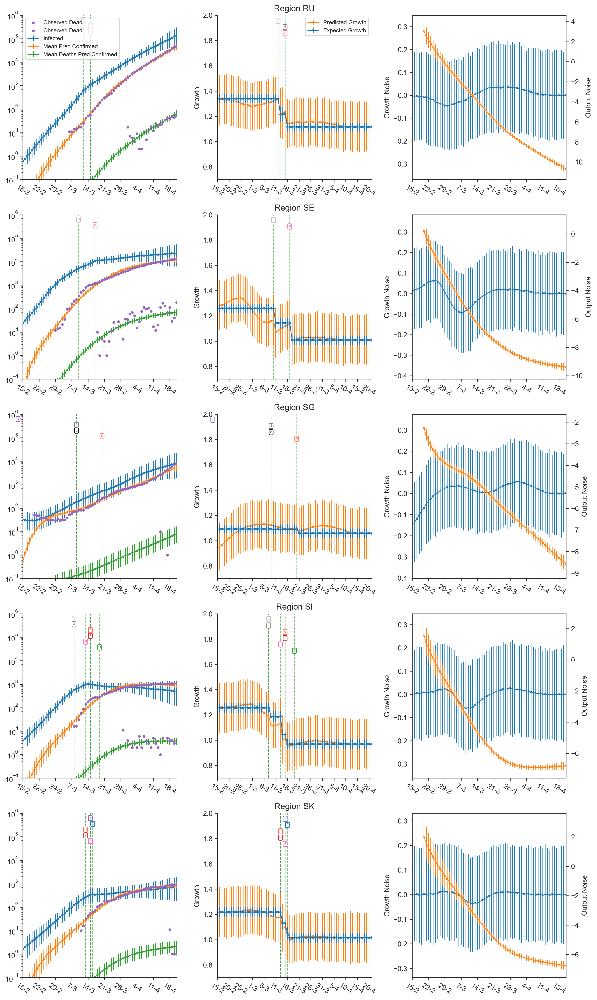

In [9]:
model.OR_indxs =  range(len(model.d.Rs))
model.ORs = model.d.Rs
model.ObservedDaysIndx = list(range(len(model.d.Ds)))[10:]
model.ObservedDaysSlc= slice(10,None)
model.plot_region_predictions()

In [ ]:
end = model.trace.point(-1)

In [ ]:
v =[
    'InitialSize',
    'HyperGrowthRateMean',
    'HyperGrowthRateVar',
    'RegionGrowthRate',
    'CM_Alpha',
    'ReportRateLog',
    'ReportRateMean',
    'ReportRateStd',
    'DelayCMean','DelayCAlpha',
    'DeathsNoise',
]

pm.traceplot(model.trace, v);

In [ ]:

model.plot_effect()

In [ ]:
np.std(model.trace['ReportRate'], axis=0)

In [ ]:
regions[21]

In [ ]:
good_trace2 = model.trace

In [ ]:
start2 = model.trace.point(-1)

In [ ]:
def norm(x): 
    s = T.sum(x)
    return x / s

DelayDDist = pm.NegativeBinomial.dist(mu=23.5, alpha=8)

nDelayD = 60
xD = np.arange( nDelayD)
DeathDelayProb = norm(T.exp(DelayDDist.logp(xD)))


In [ ]:
n=100
DelayDDist = pm.Beta.dist(.002*n+1,n+1 )

x = np.linspace(0,1,1000)
y = norm(T.exp(DelayDDist.logp(x))).tag.test_value
plt.plot(x, y)
plt.xlim(0,.1)


In [ ]:

with cm_effect.models.CMConfirmedAndDeaths(data) as model2:
    model2.build()
    

In [ ]:
with model2:
    model2.trace = pm.sample(500, chains=2, cores=2, init='adapt_diag', start=start)

In [ ]:
model2.OR_indxs = range(len(model.d.Rs))
model2.ORs = model.d.Rs
model2.plot_region_predictions()

In [ ]:
model2.vars

In [ ]:
v =[
    'InitialSize',
    'ConfirmationNoise',
    'DeathNoise',
    'HyperGrowthRateMean',
    'HyperGrowthRateVar',
    'RegionGrowthRate',
    'CM_Alpha',
    'ReportRate',
    
]
pm.traceplot(model2.trace, v)

In [ ]:
model2.trace['diverging'].nonzero()

In [ ]:
model2.trace.point(-1)

In [ ]:
pm.traceplot(model2.trace, ['CM_Alpha_log__'])

In [ ]:
import arviz as az 
az.plot_trace(model2.trace['CM_Alpha_log__'][None, :,:])

In [ ]:
model2.trace['CM_Alpha_log__'].shape

In [ ]:
np.cumsum([.1,.2,.3])

In [ ]:
#goodtrace = model.trace
#goodmodel = model